In [1]:
import lasio
import seaborn
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

In [111]:
#%% Loading DataSet

#Alaska dataSet
alaska2 = lasio.read('well_logs/dados_alaska/dado2.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD','CALI']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD', 'CALI'])
alaska2['DEPTH'] = alaska2.index
print('Alaska 2 - Correlações')
print(alaska2.corr())
alaska3 = lasio.read('well_logs/dados_alaska/dado3.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
alaska3['DEPTH'] = alaska3.index
print('Alaska 3 - Correlações')
print(alaska3.corr())
alaska4 = lasio.read('well_logs/dados_alaska/dado4.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
print('Alaska 4 - Correlações')
print(alaska4.corr())
alaska5 = lasio.read('well_logs/dados_alaska/dado5.las').df().loc[:,['RHOB','NPHI', 'DT', 'GR', 'ILD']].dropna(subset=['RHOB','NPHI', 'DT', 'GR', 'ILD'])
print('Alaska 5 - Correlações')
alaska5['DEPTH'] = alaska5.index
print(alaska5.corr())



Alaska 2 - Correlações
           RHOB      NPHI        DT        GR       ILD      CALI     DEPTH
RHOB   1.000000 -0.322254 -0.250311  0.291251 -0.145727 -0.608651  0.278628
NPHI  -0.322254  1.000000  0.522223  0.503283 -0.164131  0.428572 -0.428740
DT    -0.250311  0.522223  1.000000  0.325420 -0.141120  0.095233 -0.444379
GR     0.291251  0.503283  0.325420  1.000000 -0.283312 -0.143397 -0.023131
ILD   -0.145727 -0.164131 -0.141120 -0.283312  1.000000  0.108324  0.023544
CALI  -0.608651  0.428572  0.095233 -0.143397  0.108324  1.000000 -0.223120
DEPTH  0.278628 -0.428740 -0.444379 -0.023131  0.023544 -0.223120  1.000000
Alaska 3 - Correlações
           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.428836 -0.377076 -0.012439  0.294842  0.621318
NPHI  -0.428836  1.000000  0.520852  0.671720 -0.693584 -0.502024
DT    -0.377076  0.520852  1.000000  0.377237 -0.403318 -0.709686
GR    -0.012439  0.671720  0.377237  1.000000 -0.583643 -0.326429
ILD    0.294842 

In [142]:
alaska2['LOF'] = 1
alaska2_lof = alaska2['LOF']
alaska2.loc[(alaska2['CALI'] > 11), 'LOF'] = -1
alaska2 = alaska2.drop(alaska2[alaska2['LOF']==-1].index)
alaska2 = alaska2.drop(['LOF'], axis = 1)

In [143]:
# Corrigir rhob com caliper

X_alaska2 = np.array(alaska2.loc[:,['CALI', 'DT', 'ILD']])
rhob_alaska2 = np.array(alaska2.loc[:, ['RHOB']])
alaska2['CALI_MEAN'] = alaska2['CALI'].median()
alaska2
X_alaska2_test = np.array(alaska2.loc[:,['CALI_MEAN', 'DT', 'ILD']])

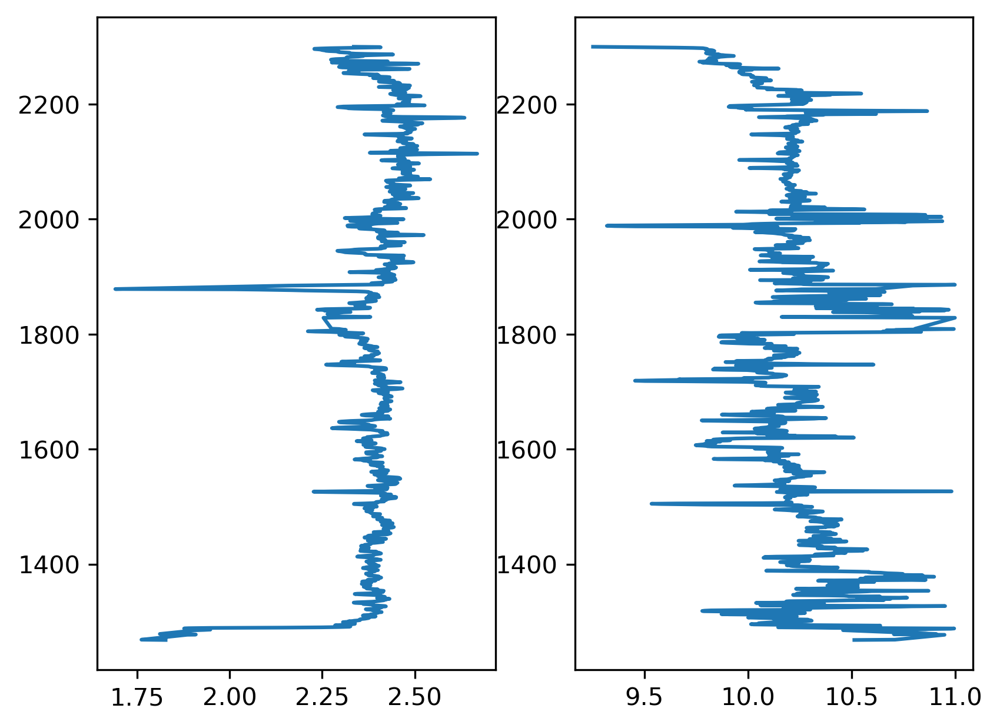

In [144]:
plt.figure(dpi=300)
plt.subplot(121)
plt.plot(alaska2['RHOB'], alaska2['DEPTH'])
plt.subplot(122)
plt.plot(alaska2['CALI'], alaska2['DEPTH'])

In [154]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_alaska2_sclnd = scaler.fit_transform(X_alaska2)
X_alaska2_test_sclnd = scaler.transform(X_alaska2_test)

In [160]:
from sklearn.svm import SVR

svr_model_rhob = SVR().fit(X_alaska2, rhob_alaska2)

rhob_alaska2_pred = svr_model.predict(X_alaska2_test)



C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


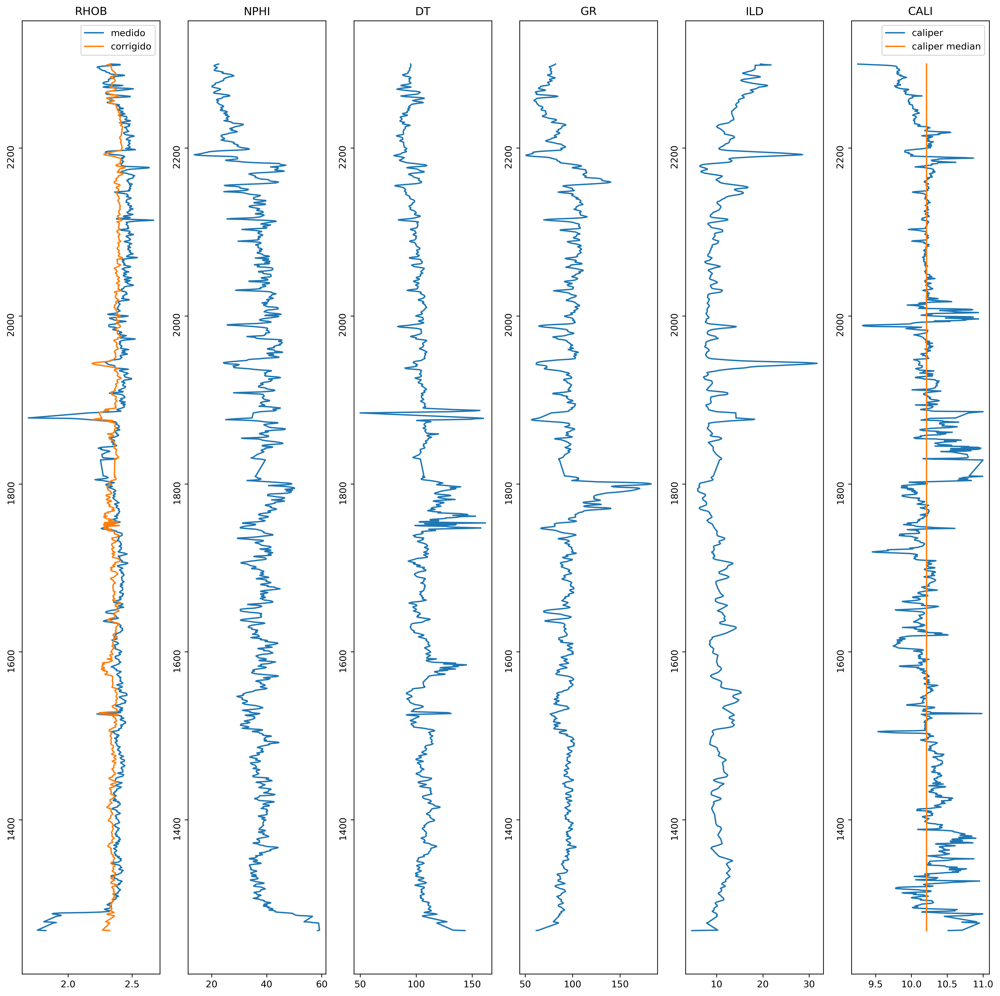

In [161]:
plt.figure(dpi=300, figsize=[15,15])
plt.subplot(161)
plt.plot(alaska2['RHOB'], alaska2['DEPTH'],label = 'medido')
plt.plot(rhob_alaska2_pred, alaska2['DEPTH'], label = 'corrigido')
plt.legend(loc='best')
plt.yticks(rotation=90)
plt.title('RHOB')
plt.subplot(162)
plt.plot(alaska2['NPHI'], alaska2['DEPTH'])
plt.yticks(rotation=90)
plt.title('NPHI')
plt.subplot(163)
plt.plot(alaska2['DT'], alaska2['DEPTH'])
plt.yticks(rotation=90)
plt.title('DT')
plt.subplot(164)
plt.plot(alaska2['GR'], alaska2['DEPTH'])
plt.yticks(rotation=90)
plt.title('GR')
plt.subplot(165)
plt.plot(alaska2['ILD'], alaska2['DEPTH'])
plt.yticks(rotation=90)
plt.title('ILD')
plt.subplot(166)
plt.plot(alaska2['CALI'], alaska2['DEPTH'], label = 'caliper')
plt.plot(alaska2['CALI_MEAN'], alaska2['DEPTH'], label = 'caliper median')
plt.legend(loc='best')
plt.yticks(rotation=90)
plt.title('CALI')
plt.tight_layout()         

In [157]:
alaska2['RHOB_C'] = rhob_alaska2_pred
alaska2.corr()

,RHOB,NPHI,DT,GR,ILD,CALI,DEPTH,CALI_MEAN,RHOB_C
RHOB,1.000000,-0.078994,-0.384017,0.225326,-0.113136,-0.101229,0.301921,NaN,-0.253333
NPHI,-0.078994,1.000000,0.559975,0.658003,-0.790994,0.326120,-0.398460,NaN,0.708798
DT,-0.384017,0.559975,1.000000,0.359748,-0.494202,0.118810,-0.448203,NaN,0.949303
GR,0.225326,0.658003,0.359748,1.000000,-0.663336,0.132777,-0.053057,NaN,0.516430
ILD,-0.113136,-0.790994,-0.494202,-0.663336,1.000000,-0.243255,0.187461,NaN,-0.739560
CALI,-0.101229,0.326120,0.118810,0.132777,-0.243255,1.000000,-0.299072,NaN,0.174665
DEPTH,0.301921,-0.398460,-0.448203,-0.053057,0.187461,-0.299072,1.000000,NaN,-0.395234
CALI_MEAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RHOB_C,-0.253333,0.708798,0.949303,0.516430,-0.739560,0.174665,-0.395234,NaN,1.000000


# Analise do caliper

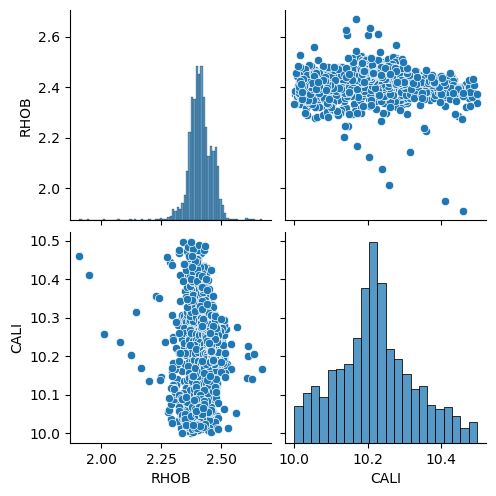

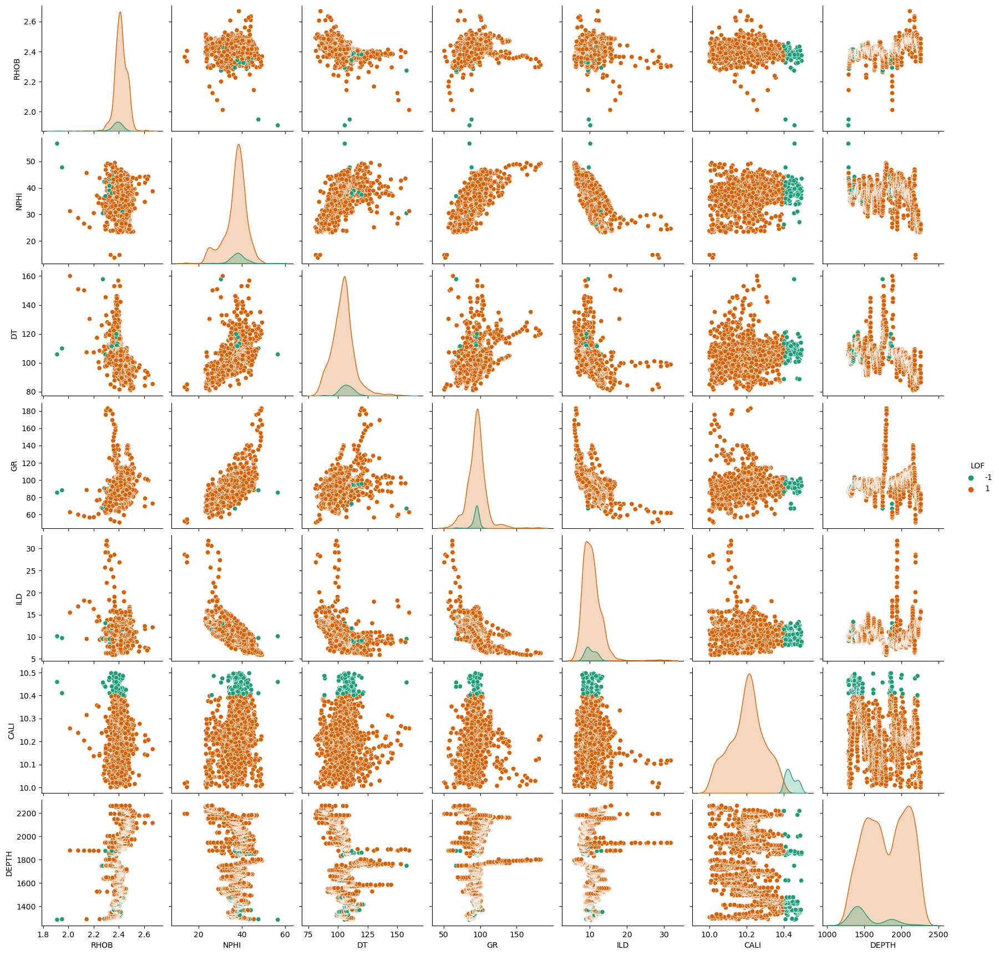

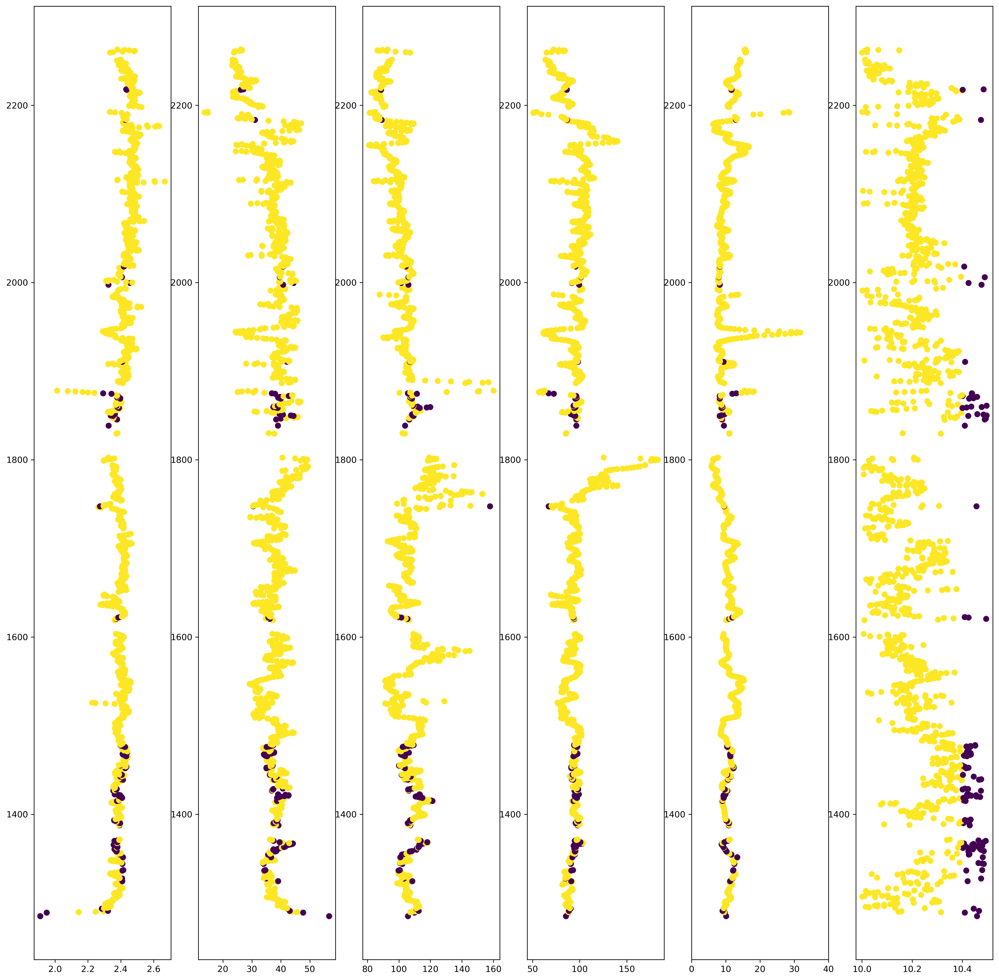

In [12]:
seaborn.pairplot(alaska2.loc[:,['RHOB', 'CALI']])
alaska2['LOF'] = 1
alaska2_lof = alaska2['LOF']
alaska2.loc[(alaska2['CALI'] > 10.4) | (alaska2['CALI'] < 10), 'LOF'] = -1
#alaska2.loc[(alaska2['RHOB'] < 2.15) | (alaska2['RHOB'] > 2.55), 'LOF'] = -1
#alaska2.loc[(alaska2['ILD'] > 25), 'LOF'] = -1
#alaska2.loc[(alaska2['GR'] > 125), 'LOF'] = -1
#alaska2.loc[(alaska2['DT'] > 125), 'LOF'] = -1
seaborn.pairplot(alaska2, hue='LOF', palette='Dark2')

alaska2_lof = alaska2['LOF']
plt.figure(dpi=300, figsize=[20,20])
plt.subplot(161)
plt.scatter(alaska2['RHOB'], alaska2.index, c=alaska2_lof)
plt.subplot(162)
plt.scatter(alaska2['NPHI'], alaska2.index, c=alaska2_lof)
plt.subplot(163)
plt.scatter(alaska2['DT'], alaska2.index, c=alaska2_lof)
plt.subplot(164)
plt.scatter(alaska2['GR'], alaska2.index, c=alaska2_lof)
plt.subplot(165)
plt.scatter(alaska2['ILD'], alaska2.index, c=alaska2_lof)
plt.xlim(0,40)
plt.subplot(166)
plt.scatter(alaska2['CALI'], alaska2.index, c=alaska2_lof)

C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

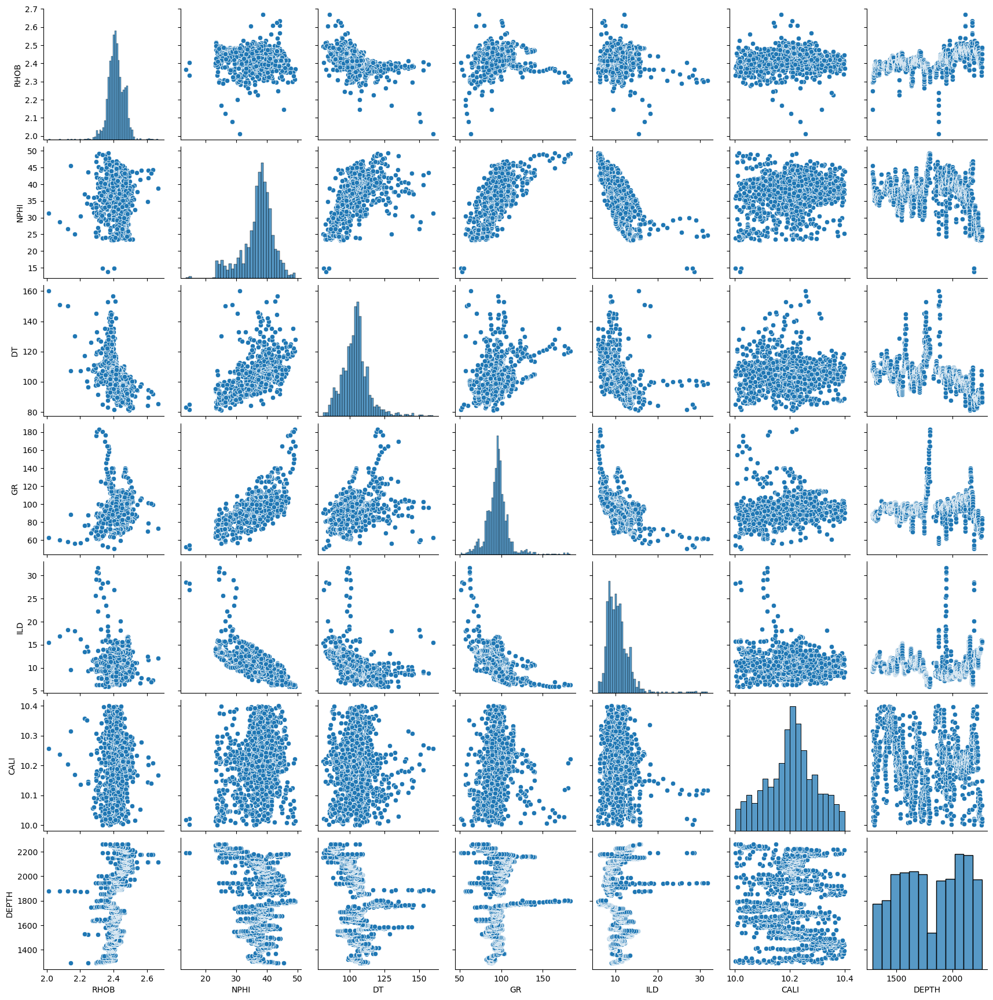

In [13]:
alaska2 = alaska2.drop(alaska2[alaska2['LOF']==-1].index)
alaska2 = alaska2.drop(['LOF'], axis = 1)
seaborn.pairplot(alaska2, palette='Dark2')

In [15]:
alaska2.corr()

,RHOB,NPHI,DT,GR,ILD,CALI,DEPTH
RHOB,1.000000,-0.077719,-0.539295,0.190672,-0.116125,0.111529,0.534940
NPHI,-0.077719,1.000000,0.553429,0.653075,-0.737297,0.226811,-0.234965
DT,-0.539295,0.553429,1.000000,0.309811,-0.434657,0.038113,-0.431933
GR,0.190672,0.653075,0.309811,1.000000,-0.632283,0.119091,0.099294
ILD,-0.116125,-0.737297,-0.434657,-0.632283,1.000000,-0.157401,-0.007453
CALI,0.111529,0.226811,0.038113,0.119091,-0.157401,1.000000,-0.153728
DEPTH,0.534940,-0.234965,-0.431933,0.099294,-0.007453,-0.153728,1.000000


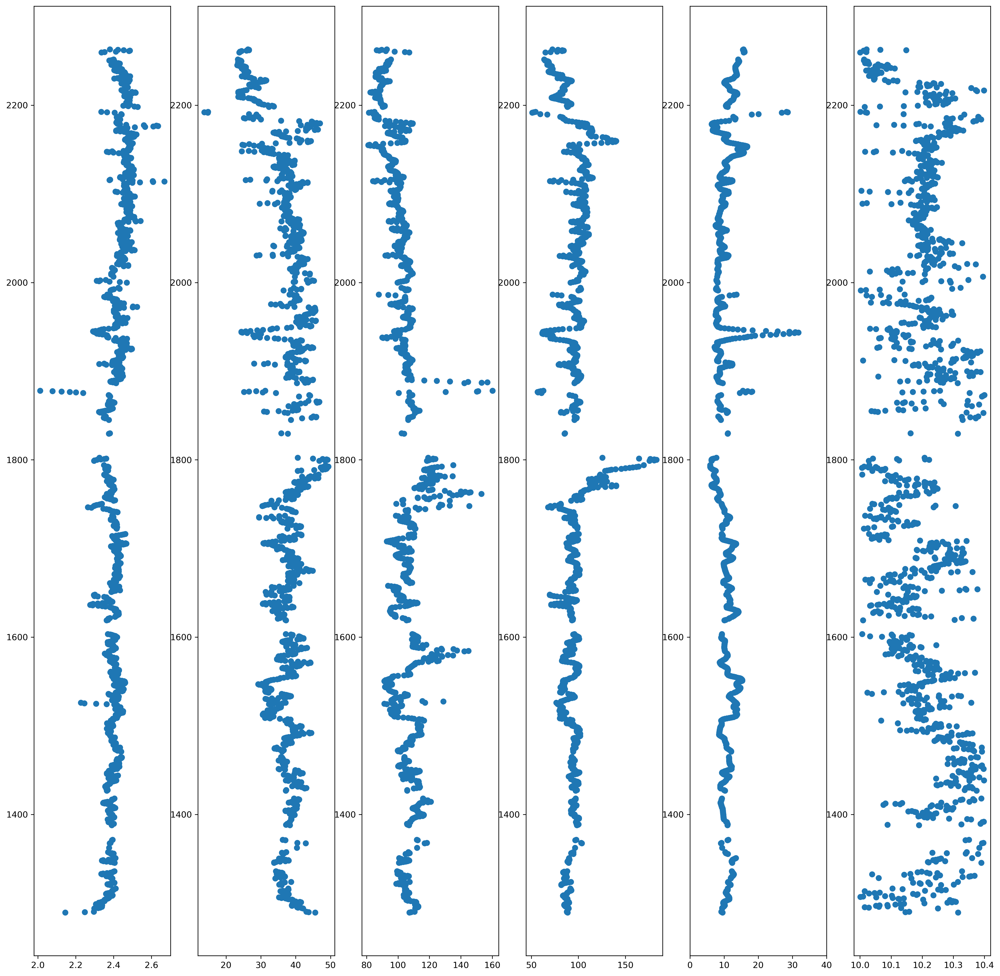

In [14]:
plt.figure(dpi=300, figsize=[20,20])
plt.subplot(161)
plt.scatter(alaska2['RHOB'], alaska2.index)
plt.subplot(162)
plt.scatter(alaska2['NPHI'], alaska2.index)
plt.subplot(163)
plt.scatter(alaska2['DT'], alaska2.index)
plt.subplot(164)
plt.scatter(alaska2['GR'], alaska2.index)
plt.subplot(165)
plt.scatter(alaska2['ILD'], alaska2.index)
plt.xlim(0,40)
plt.subplot(166)
plt.scatter(alaska2['CALI'], alaska2.index)

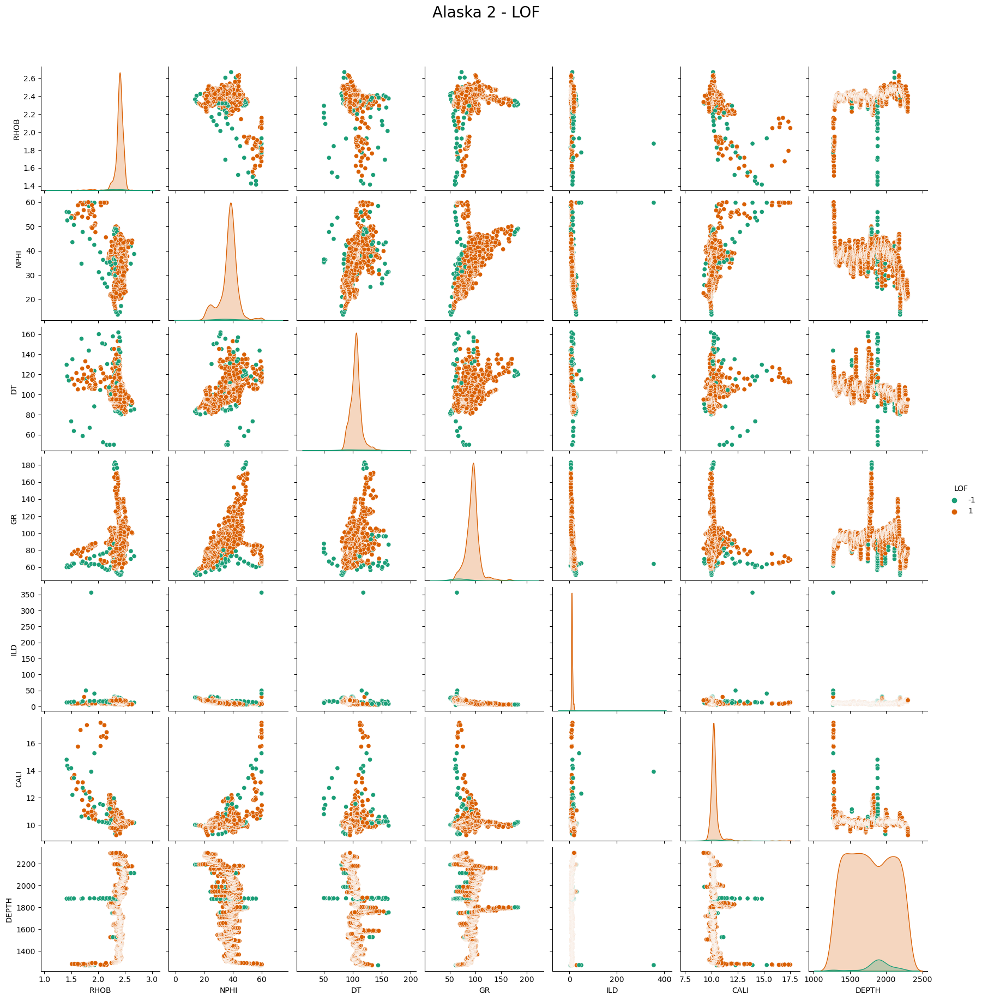

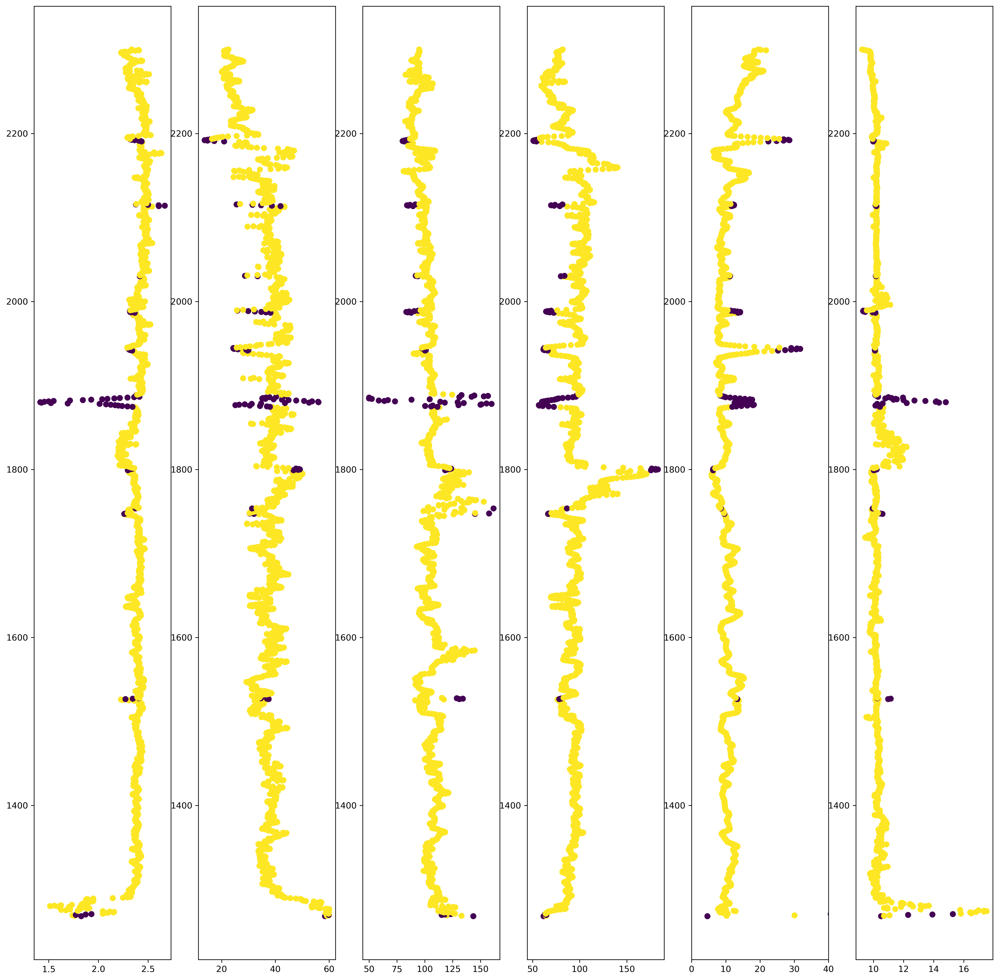

In [7]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(n_neighbors=40)

#### Alaska2
alaska2_lof = lof.fit_predict(alaska2)
alaska2['LOF'] = alaska2_lof
seaborn.pairplot(alaska2.loc[:,['RHOB', hue='LOF', palette='Dark2').fig.suptitle("Alaska 2 - LOF", y=1.05, fontsize=20)

plt.figure(dpi=300, figsize=[20,20])
plt.subplot(161)
plt.scatter(alaska2['RHOB'], alaska2.index, c=alaska2_lof)
plt.subplot(162)
plt.scatter(alaska2['NPHI'], alaska2.index, c=alaska2_lof)
plt.subplot(163)
plt.scatter(alaska2['DT'], alaska2.index, c=alaska2_lof)
plt.subplot(164)
plt.scatter(alaska2['GR'], alaska2.index, c=alaska2_lof)
plt.subplot(165)
plt.scatter(alaska2['ILD'], alaska2.index, c=alaska2_lof)
plt.xlim(0,40)
plt.subplot(166)
plt.scatter(alaska2['CALI'], alaska2.index, c=alaska2_lof)


Correlações após o LOF aplicado
           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.306504 -0.314232  0.251769 -0.047196  0.336127
NPHI  -0.306504  1.000000  0.603281  0.536152 -0.736326 -0.428158
DT    -0.314232  0.603281  1.000000  0.382307 -0.555331 -0.492399
GR     0.251769  0.536152  0.382307  1.000000 -0.649024 -0.003622
ILD   -0.047196 -0.736326 -0.555331 -0.649024  1.000000  0.165111
DEPTH  0.336127 -0.428158 -0.492399 -0.003622  0.165111  1.000000


C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

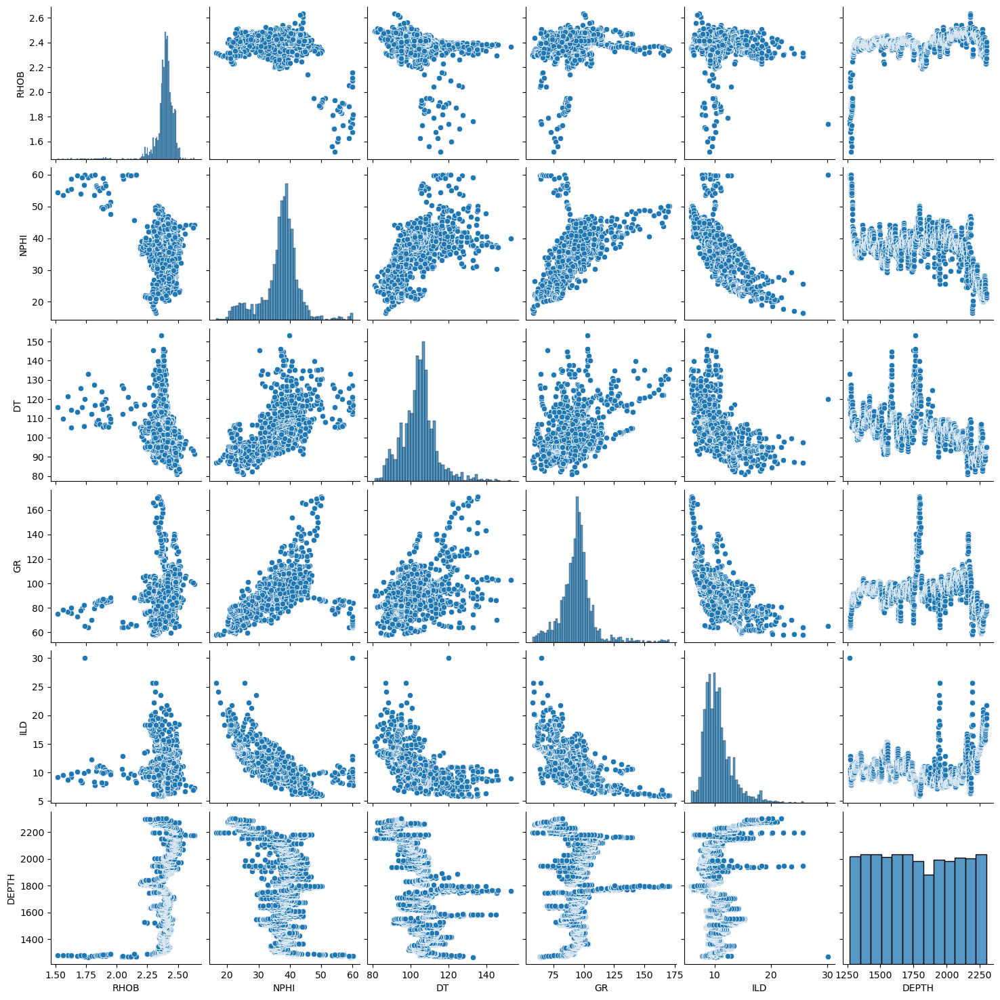

In [4]:
# Dropar outliers Alaska2
alaska2 = alaska2.drop(alaska2[alaska2['LOF']==-1].index)
alaska2 = alaska2.drop(['LOF'], axis = 1)
print('Correlações após o LOF aplicado')
print(alaska2.corr())
seaborn.pairplot(alaska2, palette='Dark2')

(0.0, 40.0)

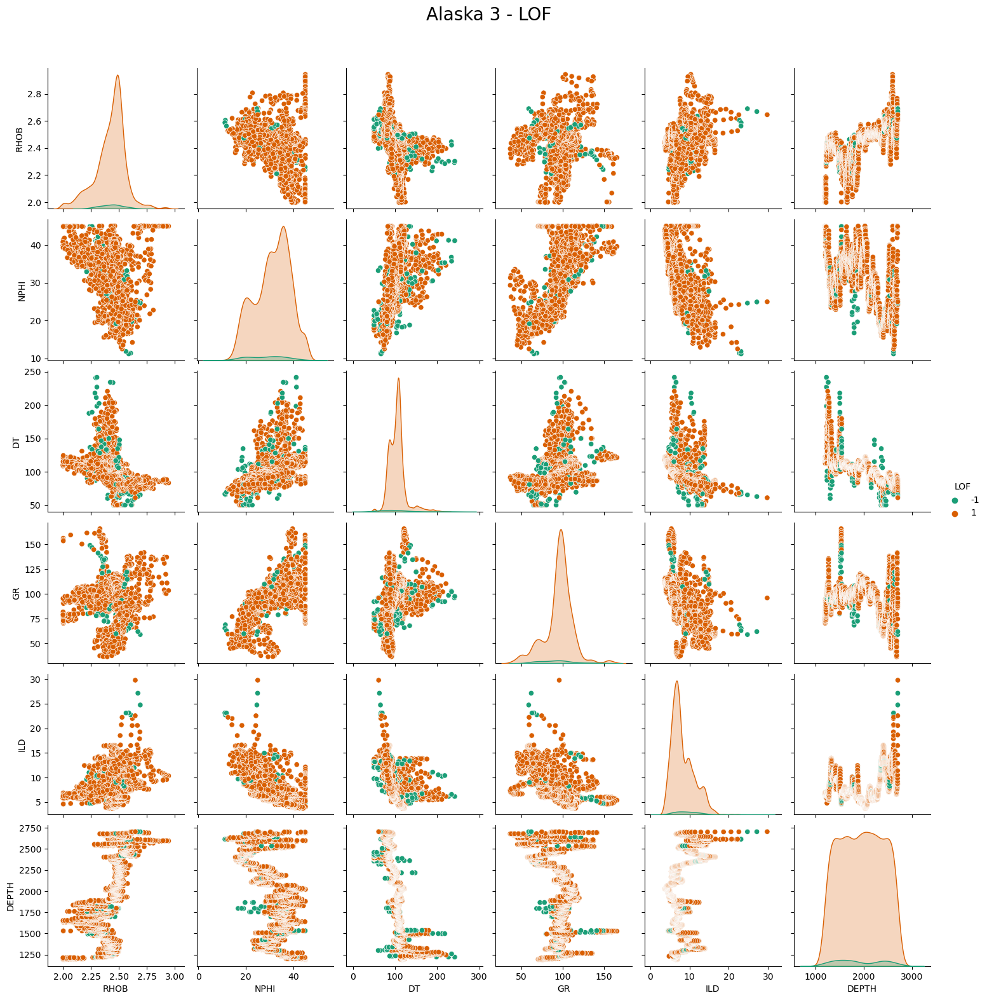

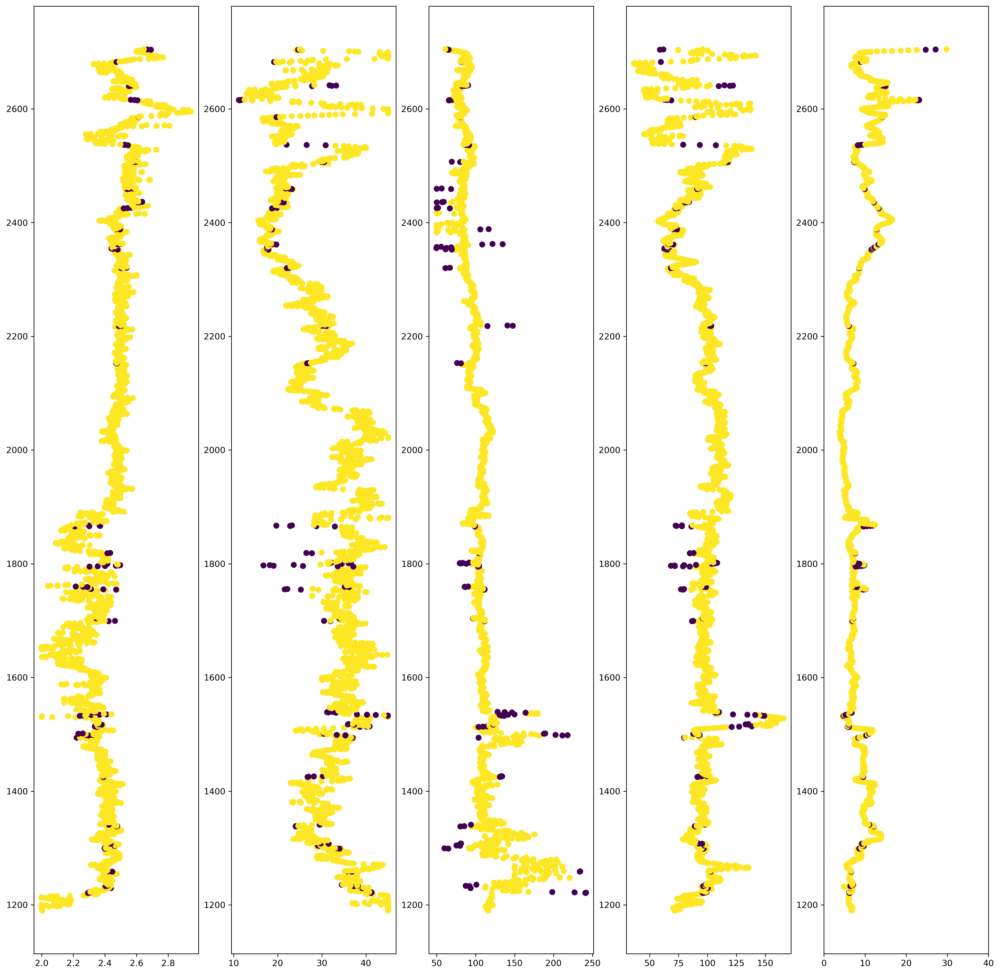

In [5]:
#### Alaska3
lof = LocalOutlierFactor(n_neighbors=20)

alaska3_lof = lof.fit_predict(alaska3)
alaska3['LOF'] = alaska3_lof
seaborn.pairplot(alaska3, hue='LOF', palette='Dark2').fig.suptitle("Alaska 3 - LOF", y=1.05, fontsize=20)

plt.figure(dpi=300, figsize=[20,20])
plt.subplot(151)
plt.scatter(alaska3['RHOB'], alaska3.index, c=alaska3_lof)
plt.subplot(152)
plt.scatter(alaska3['NPHI'], alaska3.index, c=alaska3_lof)
plt.subplot(153)
plt.scatter(alaska3['DT'], alaska3.index, c=alaska3_lof)
plt.subplot(154)
plt.scatter(alaska3['GR'], alaska3.index, c=alaska3_lof)
plt.subplot(155)
plt.scatter(alaska3['ILD'], alaska3.index, c=alaska3_lof)
plt.xlim(0,40)



C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

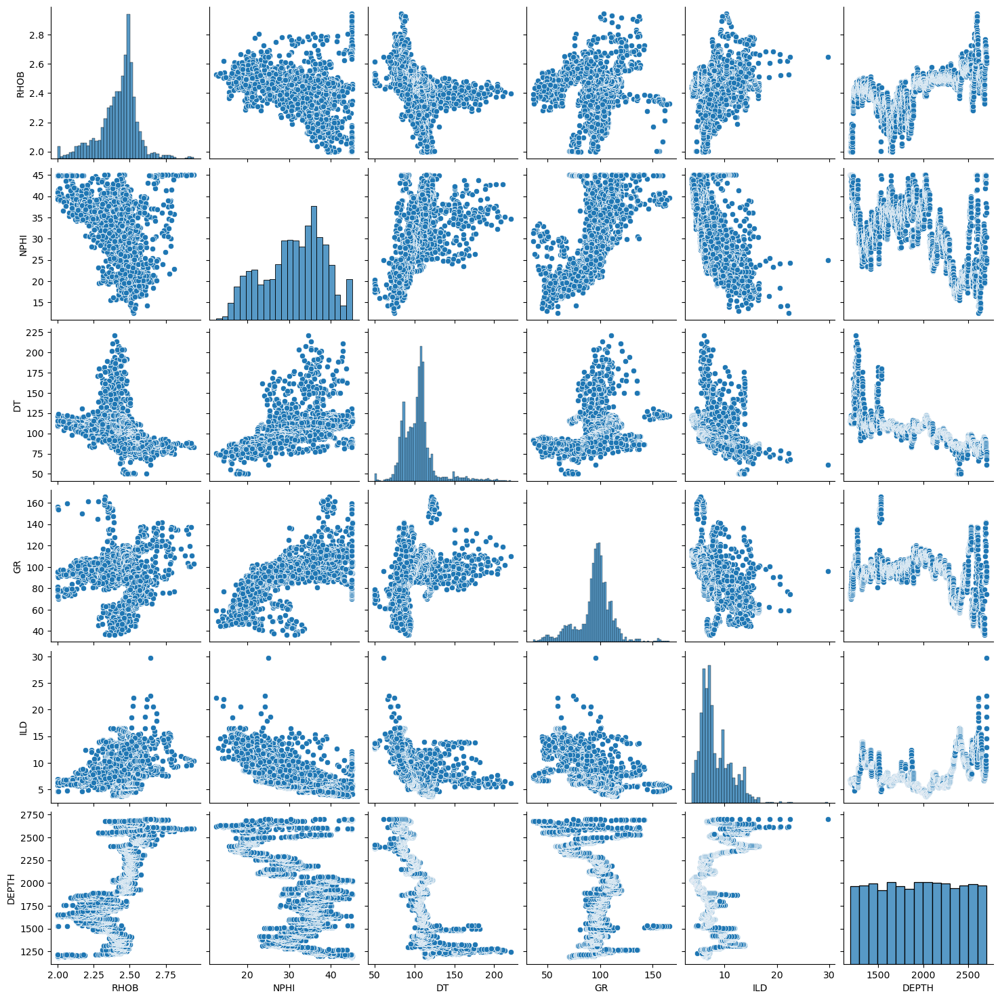

In [6]:
# Dropa alaska 3 com lof
alaska3 = alaska3.drop(alaska3[alaska3['LOF']==-1].index)
alaska3 = alaska3.drop(['LOF'], axis = 1)
alaska3.corr()
seaborn.pairplot(alaska3, palette='Dark2')

In [7]:
alaska3.corr()

,RHOB,NPHI,DT,GR,ILD,DEPTH
RHOB,1.000000,-0.423714,-0.379606,-0.000125,0.285360,0.619410
NPHI,-0.423714,1.000000,0.533993,0.664798,-0.694247,-0.497081
DT,-0.379606,0.533993,1.000000,0.390755,-0.414469,-0.739953
GR,-0.000125,0.664798,0.390755,1.000000,-0.583336,-0.321920
ILD,0.285360,-0.694247,-0.414469,-0.583336,1.000000,0.291367
DEPTH,0.619410,-0.497081,-0.739953,-0.321920,0.291367,1.000000


(0.0, 40.0)

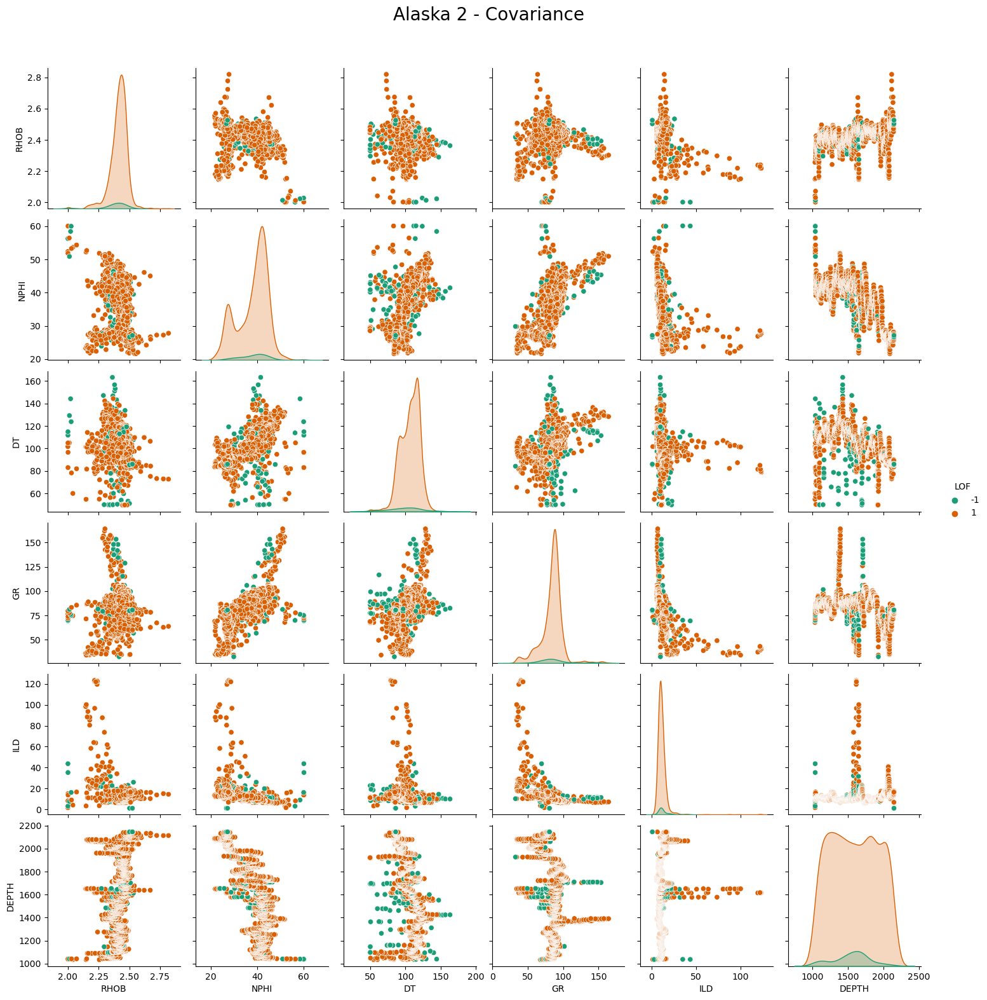

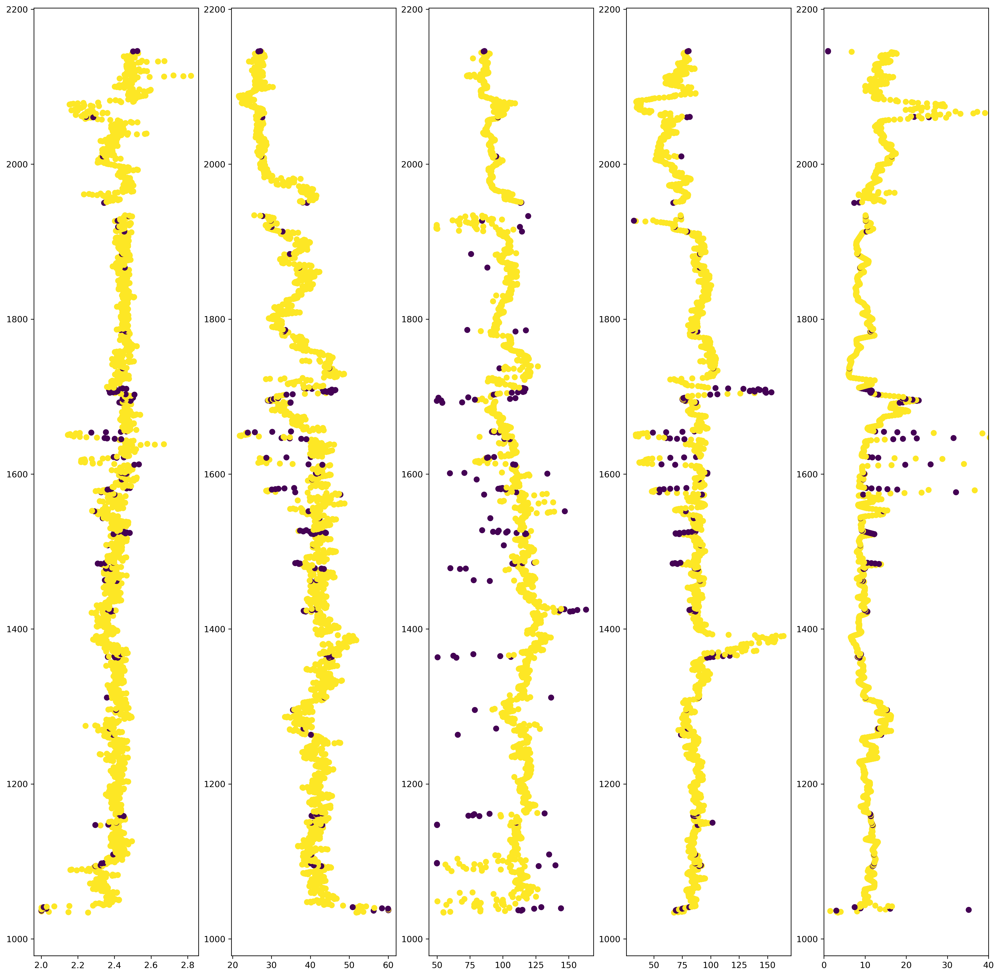

In [8]:
#### Alaska5
alaska5_lof = lof.fit_predict(alaska5.iloc[:,1:])
alaska5['LOF'] = alaska5_lof
seaborn.pairplot(alaska5, hue='LOF', palette='Dark2').fig.suptitle("Alaska 2 - Covariance", y=1.05, fontsize=20)

plt.figure(dpi=300, figsize=[20,20])
plt.subplot(151)
plt.scatter(alaska5['RHOB'], alaska5.index, c=alaska5_lof)
plt.subplot(152)
plt.scatter(alaska5['NPHI'], alaska5.index, c=alaska5_lof)
plt.subplot(153)
plt.scatter(alaska5['DT'], alaska5.index, c=alaska5_lof)
plt.subplot(154)
plt.scatter(alaska5['GR'], alaska5.index, c=alaska5_lof)
plt.subplot(155)
plt.scatter(alaska5['ILD'], alaska5.index, c=alaska5_lof)
plt.xlim(0,40)

           RHOB      NPHI        DT        GR       ILD     DEPTH
RHOB   1.000000 -0.190430 -0.197600  0.176471 -0.335214  0.306435
NPHI  -0.190430  1.000000  0.719521  0.697137 -0.393001 -0.729397
DT    -0.197600  0.719521  1.000000  0.532564 -0.251687 -0.566045
GR     0.176471  0.697137  0.532564  1.000000 -0.522794 -0.372550
ILD   -0.335214 -0.393001 -0.251687 -0.522794  1.000000  0.115932
DEPTH  0.306435 -0.729397 -0.566045 -0.372550  0.115932  1.000000


C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Rafael Lima\anaconda3\lib\site-packages\seaborn\axisgrid.py:1507: UserW

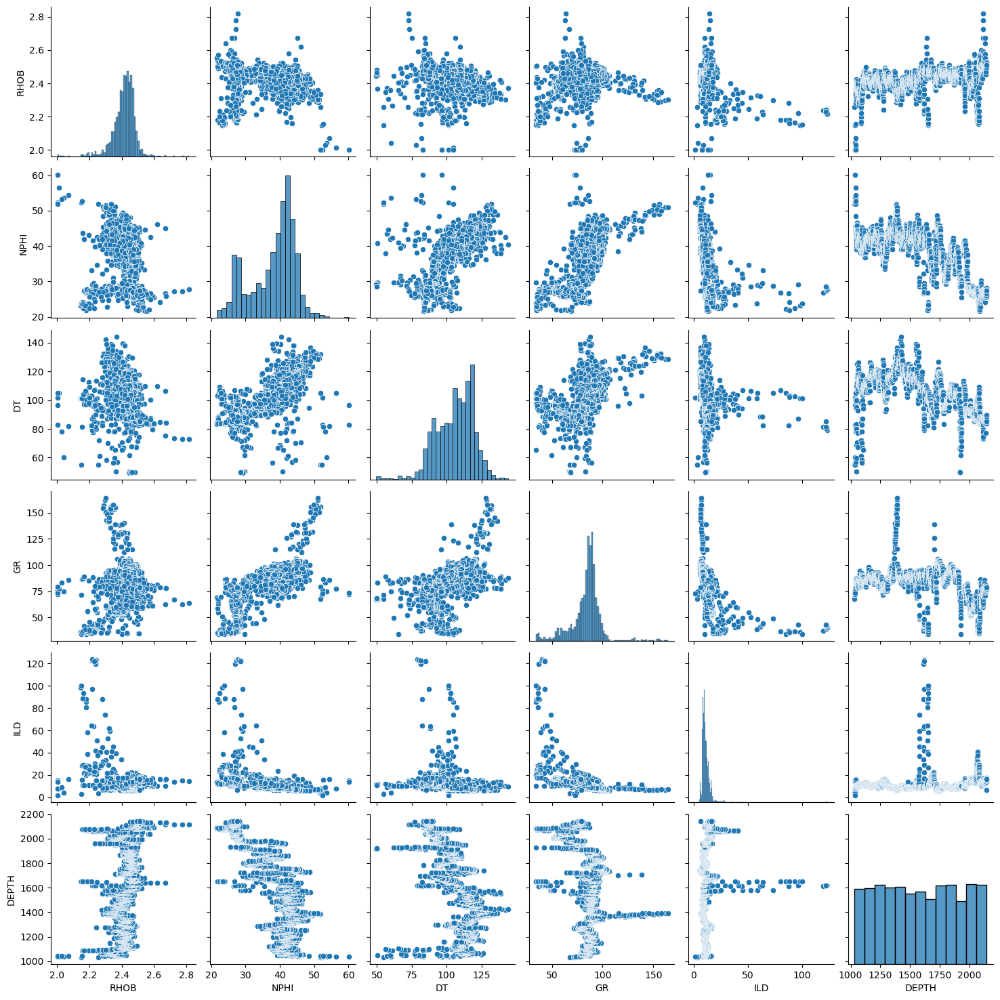

In [9]:
#drop alaska 5 com lof
alaska5 = alaska5.drop(alaska5[alaska5['LOF']==-1].index)
alaska5 = alaska5.drop(['LOF'], axis = 1)
print(alaska5.corr())
seaborn.pairplot(alaska5, palette='Dark2') 

# Concatenate data

In [10]:
alaska_concat = pd.concat([alaska2,alaska3])

In [11]:
alaska_concat.corr()

,RHOB,NPHI,DT,GR,ILD,DEPTH
RHOB,1.000000,-0.407766,-0.360657,0.072642,0.112119,0.559499
NPHI,-0.407766,1.000000,0.494791,0.560989,-0.445338,-0.510037
DT,-0.360657,0.494791,1.000000,0.380547,-0.389246,-0.674861
GR,0.072642,0.560989,0.380547,1.000000,-0.567538,-0.224342
ILD,0.112119,-0.445338,-0.389246,-0.567538,1.000000,0.143858
DEPTH,0.559499,-0.510037,-0.674861,-0.224342,0.143858,1.000000


In [12]:
X_ref = alaska_concat.loc[:,['NPHI','DT','GR', 'ILD']]
y_ref = alaska_concat.iloc[:,0]
X_alaska5 = alaska5.loc[:,['NPHI','DT','GR', 'ILD']]
y_alaska5 = alaska5.iloc[:,0]

# Train Test Split

In [13]:


X_train, X_test, y_train, y_test = train_test_split(X_ref, y_ref, test_size=0.33, random_state=7)

# Power Transform aplication

In [14]:
pt = PowerTransformer()
y_pt = PowerTransformer()
X_train_pt = pt.fit_transform(X_train)
y_train_pt = y_pt.fit_transform(np.array(y_train).reshape(-1,1))
X_test_pt = pt.transform(X_test)
y_test_pt = y_pt.transform(np.array(y_test).reshape(-1,1))
X_alaska5_pt = pt.transform(X_alaska5)
y_alaska5_pt = y_pt.transform(np.array(y_alaska5).reshape(-1,1))

# SVR model

In [15]:
from sklearn.svm import SVR

svr_model = SVR().fit(X_train_pt, y_train_pt)

y_train_pred = y_pt.inverse_transform(svr_model.predict(X_train_pt).reshape(-1,1))
y_test_pred = y_pt.inverse_transform(svr_model.predict(X_test_pt).reshape(-1,1))

from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse

print('MSE train: {}'.format(mse(y_train, y_train_pred)))
print('MSE test: {}'.format(mse(y_test, y_test_pred)))
print('R^2 train: {}'.format(r2(y_train, y_train_pred)))
print('R^2 test: {}'.format(r2(y_test, y_test_pred)))


y_alaska5_pred = y_pt.inverse_transform(svr_model.predict(X_alaska5_pt).reshape(-1,1))

print('MSE in alaska 5: {}'.format(mse(y_alaska5, y_alaska5_pred)))
print('R^2 in alaska 5: {}'.format(r2(y_alaska5, y_alaska5_pred)))

C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MSE train: 0.00318423743500909
MSE test: 0.003281877046385178
R^2 train: 0.7876346936163527
R^2 test: 0.7822102498325719
MSE in alaska 5: 0.009544207033939649
R^2 in alaska 5: -0.9390406580690833


In [16]:
# Buscar o melhor epsilon na escala logaritma

epsilon = np.array([])
r2_train = np.array([])
r2_test = np.array([])
r2_alaska5 = np.array([])

mse_train = np.array([])
mse_test = np.array([])
mse_alaska5 = np.array([])

degree = np.array([])
for i in np.linspace(0.1, 0.05, 20):#:
    print("#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#")
    print('epsilon: {}'.format(i))
    epsilon = np.append(epsilon, i)
    
    svr_model = SVR(epsilon=i).fit(X_train_pt, y_train_pt)
    y_train_pred = y_pt.inverse_transform(svr_model.predict(X_train_pt).reshape(-1,1))
    y_test_pred = y_pt.inverse_transform(svr_model.predict(X_test_pt).reshape(-1,1))
    y_alaska5_pred = y_pt.inverse_transform(svr_model.predict((X_alaska5_pt)).reshape(-1,1))
    
    r2_train = np.append(r2_train, r2(y_train, y_train_pred))
    print('$R^2$ train: {}'.format(r2(y_train, y_train_pred)))
    r2_test = np.append(r2_test, r2(y_test, y_test_pred))
    print('$R^2$ test: {}'.format(r2(y_test, y_test_pred)))
    r2_alaska5 = np.append(r2_alaska5, r2(y_alaska5, y_alaska5_pred))
    print('$R^2$ alaska 5: {}'.format(r2(y_alaska5, y_alaska5_pred)))
    
    mse_train = np.append(mse_train, mse(y_train, y_train_pred))
    print('mse train: {}'.format(mse(y_train, y_train_pred)))
    mse_test = np.append(mse_test, mse(y_test, y_test_pred))
    print('mse test: {}'.format(mse(y_test, y_test_pred)))
    mse_alaska5 = np.append(mse_alaska5, mse(y_alaska5, y_alaska5_pred))
    print('mse alaska 5: {}'.format(mse(y_alaska5, y_alaska5_pred)))



position_max_r2 = np.where(r2_test == np.max(r2_test))
position_max_r2_alaska = np.where(r2_alaska5 == np.max(r2_alaska5))
position_min_mse = np.where(mse_test == np.min(mse_test))
best_epsilon = epsilon[position_max_r2] 

#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.1


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7876346936163527
$R^2$ test: 0.7822102498325719
$R^2$ alaska 5: -0.9390406580690833
mse train: 0.00318423743500909
mse test: 0.003281877046385178
mse alaska 5: 0.009544207033939649
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.09736842105263159


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7876756084643948
$R^2$ test: 0.7821679429693373
$R^2$ alaska 5: -0.9330843242932536
mse train: 0.003183623951606355
mse test: 0.0032825145691485194
mse alaska 5: 0.009514889194479605
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.09473684210526316


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7875054750189001
$R^2$ test: 0.7819433215774692
$R^2$ alaska 5: -0.9365500473585704
mse train: 0.003186174958149356
mse test: 0.003285899392307242
mse alaska 5: 0.009531947928302453
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.09210526315789475


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7872383735532891
$R^2$ test: 0.7817048055982391
$R^2$ alaska 5: -0.9356538577407842
mse train: 0.0031901799178116847
mse test: 0.003289493593213528
mse alaska 5: 0.009527536767959722
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.08947368421052632


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7870334053994276
$R^2$ test: 0.7816526598163619
$R^2$ alaska 5: -0.9427846591195959
mse train: 0.0031932532412260626
mse test: 0.0032902793787910264
mse alaska 5: 0.009562635487728215
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.0868421052631579


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7871884119835079
$R^2$ test: 0.7819671360858946
$R^2$ alaska 5: -0.9505848351858595
mse train: 0.003190929049124696
mse test: 0.003285540531118815
mse alaska 5: 0.00960102895563607
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.08421052631578949


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.787186241834879
$R^2$ test: 0.7820258986522324
$R^2$ alaska 5: -0.9382677680098315
mse train: 0.0031909615886605612
mse test: 0.003284655037115988
mse alaska 5: 0.009540402769852003
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.08157894736842106


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7871922949287882
$R^2$ test: 0.7821999809693458
$R^2$ alaska 5: -0.938024310325021
mse train: 0.003190870827657498
mse test: 0.003282031788040782
mse alaska 5: 0.009539204439874669
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.07894736842105264


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.786936467139119
$R^2$ test: 0.7820189992449464
$R^2$ alaska 5: -0.9316242135735986
mse train: 0.0031947067481223413
mse test: 0.003284759004388956
mse alaska 5: 0.009507702342082843
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.07631578947368421


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7869192900991515
$R^2$ test: 0.7820286395453553
$R^2$ alaska 5: -0.9197659939498917
mse train: 0.00319496430325043
mse test: 0.003284613734555974
mse alaska 5: 0.009449334662853626
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.0736842105263158


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7867125306966601
$R^2$ test: 0.7817145029249625
$R^2$ alaska 5: -0.9135558922250433
mse train: 0.0031980644849169404
mse test: 0.0032893474640501475
mse alaska 5: 0.009418767744972287
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.07105263157894737


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7867176116320505
$R^2$ test: 0.7816999729144625
$R^2$ alaska 5: -0.9033748223344253
mse train: 0.0031979883006053385
mse test: 0.003289566416998607
mse alaska 5: 0.009368655212025281
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06842105263157895


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7867535881166785
$R^2$ test: 0.7818400008476338
$R^2$ alaska 5: -0.9135260731178556
mse train: 0.0031974488637684876
mse test: 0.003287456333951198
mse alaska 5: 0.009418620971498825
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06578947368421054


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7866232581546233
$R^2$ test: 0.7817102604102725
$R^2$ alaska 5: -0.9128022010950196
mse train: 0.0031994030508772308
mse test: 0.003289411394568316
mse alaska 5: 0.009415057980478871
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06315789473684211


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7866666121996275
$R^2$ test: 0.7816779427217682
$R^2$ alaska 5: -0.9094678447789053
mse train: 0.0031987529937873415
mse test: 0.0032898983903062373
mse alaska 5: 0.009398645850659165
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.06052631578947369


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7864674225087189
$R^2$ test: 0.7813389086168754
$R^2$ alaska 5: -0.9117328812682044
mse train: 0.003201739674056638
mse test: 0.003295007300371721
mse alaska 5: 0.009409794651022551
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.05789473684210527


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7863075404333146
$R^2$ test: 0.78107645107527
$R^2$ alaska 5: -0.9073327525650265
mse train: 0.003204136970010287
mse test: 0.003298962277044329
mse alaska 5: 0.009388136652700364
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.05526315789473685


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7863226306155873
$R^2$ test: 0.7811060572477146
$R^2$ alaska 5: -0.8988536654139574
mse train: 0.003203910705541237
mse test: 0.0032985161411830093
mse alaska 5: 0.009346401497281186
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.052631578947368425


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7864953886612231
$R^2$ test: 0.7813040986880821
$R^2$ alaska 5: -0.9047570661481379
mse train: 0.003201320345347849
mse test: 0.003295531851716332
mse alaska 5: 0.00937545879351521
#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#!#
epsilon: 0.05


C:\Users\Rafael Lima\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


$R^2$ train: 0.7865458922177095
$R^2$ test: 0.7813487790407236
$R^2$ alaska 5: -0.9030358771426488
mse train: 0.0032005630874044322
mse test: 0.0032948585628051422
mse alaska 5: 0.009366986880280915


([<matplotlib.axis.XTick at 0x29427515180>],
 [Text(0.05526315789473685, 0, '0.05526')])

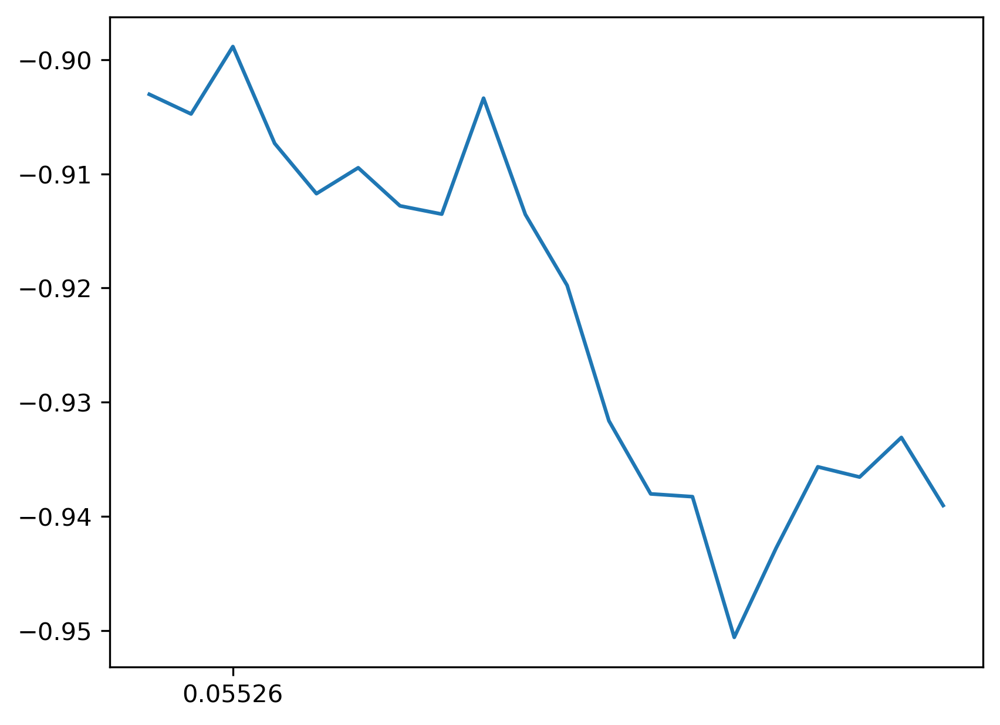

In [17]:
plt.figure(dpi=300)
plt.plot(epsilon, r2_alaska5)
plt.xticks(epsilon[position_max_r2_alaska])